# <span style="color:orange;">Parkour Athlete Tracking</span>

## Step1 导入所需库

In [88]:
# 导入所需库
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from tqdm import tqdm
import os
import csv
from IPython.display import Video
print('所有库导入成功！')

# 设置中文字体支持
plt.rcParams['font.sans-serif'] = ['SimHei']  # 使用黑体
plt.rcParams['axes.unicode_minus'] = False    # 解决负号显示问题


所有库导入成功！


## Step2 帧预处理

In [89]:
def preprocess_frame(frame):
    '''
    对输入帧进行 CLAHE 增强和色彩空间转换
    参数:
        frame: 输入的 BGR 图像帧
    返回:
        result: 预处理后的 BGR 图像帧
    '''
    # 转为 LAB 色彩空间
    lab = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    # CLAHE 增强亮度通道
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    # 转回 BGR
    result = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return result

## Step3 模型配置

In [90]:
model = YOLO('yolov8n.pt')  # 加载 YOLOv8 Nano
CONF_THRES = 0.5
IOU_THRES = 0.5
TARGET_CLASS = 0  # 0 代表 person
print('模型加载成功，参数设置完毕。')

模型加载成功，参数设置完毕。


## Step4 视频配置

In [91]:
# 文件路径设置
input_path = 'Video/parkour.mp4'
output_dir = 'Video/output/'
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, 'parkour_tracked.mp4')

# 打开视频文件
cap = cv2.VideoCapture(input_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# 获取视频基本信息
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(f'分辨率: {width}x{height}, FPS: {fps}, 总帧数: {frame_count}')

# 定义视频写入器
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

分辨率: 640x360, FPS: 14.000014000014, 总帧数: 282


## Step5 追踪系统实现

In [92]:
# 简单的基于中心点距离的多目标跟踪器
class SimpleTracker:
    def __init__(self, max_lost=32, max_dist=128):
        self.next_id = 0
        self.tracks = {}
        self.lost = {}
        self.max_lost = max_lost    # 最大丢失帧数
        self.max_dist = max_dist    # 最大距离阈值
    def update(self, detections):
        '''
        更新跟踪器状态
        参数:
            detections: 当前帧的检测结果列表，每个元素是 (x1, y1, x2, y2)
        返回:
            self.tracks: 当前的跟踪结果字典 {id: (x1, y1, x2, y2)}
        '''
        new_tracks = {}
        new_lost = {}
        det_centers = [((d[0]+d[2])//2, (d[1]+d[3])//2) for d in detections]
        # 匹配现有track
        for tid, tbox in self.tracks.items():
            tcenter = ((tbox[0]+tbox[2])//2, (tbox[1]+tbox[3])//2)
            min_dist = float('inf')
            min_idx = -1
            for i, c in enumerate(det_centers):
                if c is None:
                    continue
                dist = np.linalg.norm(np.array(tcenter)-np.array(c))
                if dist < min_dist:
                    min_dist = dist
                    min_idx = i
            if min_dist < self.max_dist and min_idx != -1:
                new_tracks[tid] = detections[min_idx]
                det_centers[min_idx] = None
            else:
                new_lost[tid] = self.lost.get(tid, 0) + 1
        # 新增track
        for i, c in enumerate(det_centers):
            if c is not None:
                new_tracks[self.next_id] = detections[i]
                self.next_id += 1
        # 移除丢失过久的track
        self.tracks = {tid: box for tid, box in new_tracks.items() if new_lost.get(tid, 0) < self.max_lost}
        self.lost = {tid: new_lost.get(tid, 0) for tid in self.tracks}
        return self.tracks

## Step6 视频处理

In [93]:
tracker = SimpleTracker()
tracking_data = []

# 逐帧处理视频,使用tqdm汇报进度
for frame_idx in tqdm(range(frame_count)):
    ret, frame = cap.read()
    if not ret:
        break
    proc_frame = preprocess_frame(frame)
    results = model(proc_frame, verbose=False)[0]  # YOLO 检测
    detections = []
    for r in results.boxes:
        if r.cls == TARGET_CLASS and r.conf > CONF_THRES:
            x1, y1, x2, y2 = map(int, r.xyxy[0])
            detections.append((x1, y1, x2, y2))
    tracks = tracker.update(detections)
    # 标注并保存
    for tid, box in tracks.items():
        x1, y1, x2, y2 = box
        cv2.rectangle(frame, (x1, y1), (x2, y2), (0,255,0), 2)
        cv2.putText(frame, f'ID:{tid}', (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,0), 2)
        tracking_data.append([frame_idx, frame_idx/fps, tid, x1, y1, x2, y2])
    out.write(frame)
cap.release()
out.release()
print('视频处理完成！')

100%|██████████| 282/282 [00:10<00:00, 26.75it/s]

视频处理完成！


## Step7 数据记录

In [94]:
# 保存追踪数据到 CSV 文件
csv_path = os.path.join(output_dir, 'tracking_data.csv')
with open(csv_path, 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['frame', 'timestamp', 'person_id', 'x1', 'y1', 'x2', 'y2'])
    writer.writerows(tracking_data)
print('追踪数据已保存到 CSV 文件。')

追踪数据已保存到 CSV 文件。


## Step8 结果可视化

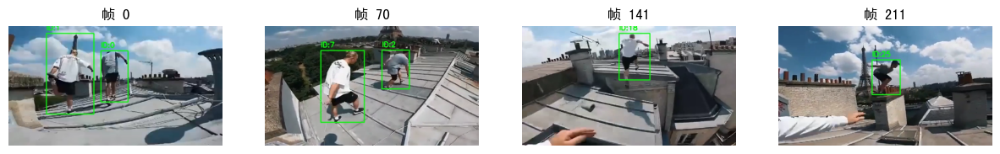

In [95]:
# 取样帧
sample_frames = [0, frame_count//4, frame_count//2, 3*frame_count//4]
cap = cv2.VideoCapture(output_path)

# 显示取样帧
fig, axs = plt.subplots(1, len(sample_frames), figsize=(15,5))
for i, idx in enumerate(sample_frames):
    cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
    ret, frame = cap.read()
    if ret:
        axs[i].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        axs[i].set_title(f'帧 {idx}')
        axs[i].axis('off')
plt.show()
cap.release()

# 嵌入视频
Video(output_path, embed=True)

# 跑酷运动员追踪作业学习心得

本次作业让我深入体验了计算机视觉领域中的目标检测与多目标追踪技术。通过使用 YOLOv8 进行人物检测，并结合简单的质心距离追踪算法，实现了对视频中运动员的自动标注和身份跟踪。

## 主要收获

1. **掌握了目标检测流程**  
   通过 ultralytics YOLOv8 模型，能够快速实现对视频帧中的人物检测，并了解了模型推理的基本参数设置和输出格式。

2. **理解了多目标追踪原理**  
   通过实现基于质心距离的追踪算法，体会到如何在连续帧中保持目标身份的一致性。也认识到简单算法在遮挡、快速移动等场景下的局限性。

3. **学会了视频与数据处理**  
   熟悉了 OpenCV 的视频读写、帧处理、结果可视化等操作，并能将追踪结果保存为 CSV 文件，便于后续分析。

4. **提升了调试与参数优化能力**  
   在调试过程中，学会了通过调整距离阈值和丢失帧数等参数，优化追踪效果，减少 ID 频繁变化的问题。

## 遇到的挑战

- 检测结果偶尔不稳定，导致同一个人 ID 变化较大。
- 遮挡和多人重叠时，简单追踪算法容易出错。
- 视频处理速度受限于模型推理和帧预处理。

## 改进建议

- 可以尝试更高级的追踪算法，如 SORT、DeepSORT 或卡尔曼滤波，提升鲁棒性。
- 增加对遮挡和漏检的容错机制，进一步优化 ID 分配策略。
- 利用 GPU 加速模型推理，提高处理效率。

## 总结

本次作业不仅加深了我对目标检测和追踪技术的理解，也锻炼了实际编程和问题解决能力。希望未来能在更复杂的场景中应用这些技术，提升算法的实用性和智能化水平。